In [5]:
import pandas as pd
import numpy as np
pd.set_option('display.max_columns', None)
from scipy import stats
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
import seaborn as sns 
%matplotlib inline

from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split

from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

### Data Cleaning

In [6]:
data = pd.read_csv('marketing_customer_analysis.csv', sep=",")
data.head()

,Unnamed: 0,Customer,State,Customer Lifetime Value,Response,Coverage,Education,Effective To Date,EmploymentStatus,Gender,Income,Location Code,Marital Status,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Policy Type,Policy,Renew Offer Type,Sales Channel,Total Claim Amount,Vehicle Class,Vehicle Size,Vehicle Type
0,0,DK49336,Arizona,4809.216960,No,Basic,College,2/18/11,Employed,M,48029,Suburban,Married,61,7.0,52,0.0,9,Corporate Auto,Corporate L3,Offer3,Agent,292.800000,Four-Door Car,Medsize,NaN
1,1,KX64629,California,2228.525238,No,Basic,College,1/18/11,Unemployed,F,0,Suburban,Single,64,3.0,26,0.0,1,Personal Auto,Personal L3,Offer4,Call Center,744.924331,Four-Door Car,Medsize,NaN
2,2,LZ68649,Washington,14947.917300,No,Basic,Bachelor,2/10/11,Employed,M,22139,Suburban,Single,100,34.0,31,0.0,2,Personal Auto,Personal L3,Offer3,Call Center,480.000000,SUV,Medsize,A
3,3,XL78013,Oregon,22332.439460,Yes,Extended,College,1/11/11,Employed,M,49078,Suburban,Single,97,10.0,3,0.0,2,Corporate Auto,Corporate L3,Offer2,Branch,484.013411,Four-Door Car,Medsize,A
4,4,QA50777,Oregon,9025.067525,No,Premium,Bachelor,1/17/11,Medical Leave,F,23675,Suburban,Married,117,NaN,31,NaN,7,Personal Auto,Personal L2,Offer1,Branch,707.925645,Four-Door Car,Medsize,NaN


In [7]:
data=data.drop(['Unnamed: 0'], axis=1)
data.head()

,Customer,State,Customer Lifetime Value,Response,Coverage,Education,Effective To Date,EmploymentStatus,Gender,Income,Location Code,Marital Status,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Policy Type,Policy,Renew Offer Type,Sales Channel,Total Claim Amount,Vehicle Class,Vehicle Size,Vehicle Type
0,DK49336,Arizona,4809.216960,No,Basic,College,2/18/11,Employed,M,48029,Suburban,Married,61,7.0,52,0.0,9,Corporate Auto,Corporate L3,Offer3,Agent,292.800000,Four-Door Car,Medsize,NaN
1,KX64629,California,2228.525238,No,Basic,College,1/18/11,Unemployed,F,0,Suburban,Single,64,3.0,26,0.0,1,Personal Auto,Personal L3,Offer4,Call Center,744.924331,Four-Door Car,Medsize,NaN
2,LZ68649,Washington,14947.917300,No,Basic,Bachelor,2/10/11,Employed,M,22139,Suburban,Single,100,34.0,31,0.0,2,Personal Auto,Personal L3,Offer3,Call Center,480.000000,SUV,Medsize,A
3,XL78013,Oregon,22332.439460,Yes,Extended,College,1/11/11,Employed,M,49078,Suburban,Single,97,10.0,3,0.0,2,Corporate Auto,Corporate L3,Offer2,Branch,484.013411,Four-Door Car,Medsize,A
4,QA50777,Oregon,9025.067525,No,Premium,Bachelor,1/17/11,Medical Leave,F,23675,Suburban,Married,117,NaN,31,NaN,7,Personal Auto,Personal L2,Offer1,Branch,707.925645,Four-Door Car,Medsize,NaN


In [8]:
cols=[col_name.lower().replace(' ', '_') for col_name in data.columns]
cols

['customer',
 'state',
 'customer_lifetime_value',
 'response',
 'coverage',
 'education',
 'effective_to_date',
 'employmentstatus',
 'gender',
 'income',
 'location_code',
 'marital_status',
 'monthly_premium_auto',
 'months_since_last_claim',
 'months_since_policy_inception',
 'number_of_open_complaints',
 'number_of_policies',
 'policy_type',
 'policy',
 'renew_offer_type',
 'sales_channel',
 'total_claim_amount',
 'vehicle_class',
 'vehicle_size',
 'vehicle_type']

In [9]:
data.columns=cols
data

,customer,state,customer_lifetime_value,response,coverage,education,effective_to_date,employmentstatus,gender,income,location_code,marital_status,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,policy_type,policy,renew_offer_type,sales_channel,total_claim_amount,vehicle_class,vehicle_size,vehicle_type
0,DK49336,Arizona,4809.216960,No,Basic,College,2/18/11,Employed,M,48029,Suburban,Married,61,7.0,52,0.0,9,Corporate Auto,Corporate L3,Offer3,Agent,292.800000,Four-Door Car,Medsize,NaN
1,KX64629,California,2228.525238,No,Basic,College,1/18/11,Unemployed,F,0,Suburban,Single,64,3.0,26,0.0,1,Personal Auto,Personal L3,Offer4,Call Center,744.924331,Four-Door Car,Medsize,NaN
2,LZ68649,Washington,14947.917300,No,Basic,Bachelor,2/10/11,Employed,M,22139,Suburban,Single,100,34.0,31,0.0,2,Personal Auto,Personal L3,Offer3,Call Center,480.000000,SUV,Medsize,A
3,XL78013,Oregon,22332.439460,Yes,Extended,College,1/11/11,Employed,M,49078,Suburban,Single,97,10.0,3,0.0,2,Corporate Auto,Corporate L3,Offer2,Branch,484.013411,Four-Door Car,Medsize,A
4,QA50777,Oregon,9025.067525,No,Premium,Bachelor,1/17/11,Medical Leave,F,23675,Suburban,Married,117,NaN,31,NaN,7,Personal Auto,Personal L2,Offer1,Branch,707.925645,Four-Door Car,Medsize,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10905,FE99816,Nevada,15563.369440,No,Premium,Bachelor,1/19/11,Unemployed,F,0,Suburban,Married,253,NaN,40,NaN,7,Personal Auto,Personal L1,Offer3,Web,1214.400000,Luxury Car,Medsize,A
10906,KX53892,Oregon,5259.444853,No,Basic,College,1/6/11,Employed,F,61146,Urban,Married,65,7.0,68,0.0,6,Personal Auto,Personal L3,Offer2,Branch,273.018929,Four-Door Car,Medsize,A
10907,TL39050,Arizona,23893.304100,No,Extended,Bachelor,2/6/11,Employed,F,39837,Rural,Married,201,11.0,63,0.0,2,Corporate Auto,Corporate L3,Offer1,Web,381.306996,Luxury SUV,Medsize,NaN
10908,WA60547,California,11971.977650,No,Premium,College,2/13/11,Employed,F,64195,Urban,Divorced,158,0.0,27,4.0,6,Personal Auto,Personal L1,Offer1,Branch,618.288849,SUV,Medsize,A


In [10]:
data.isna().sum()

customer                            0
state                             631
customer_lifetime_value             0
response                          631
coverage                            0
education                           0
effective_to_date                   0
employmentstatus                    0
gender                              0
income                              0
location_code                       0
marital_status                      0
monthly_premium_auto                0
months_since_last_claim           633
months_since_policy_inception       0
number_of_open_complaints         633
number_of_policies                  0
policy_type                         0
policy                              0
renew_offer_type                    0
sales_channel                       0
total_claim_amount                  0
vehicle_class                     622
vehicle_size                      622
vehicle_type                     5482
dtype: int64

In [11]:
data['vehicle_type'].unique()

array([nan, 'A'], dtype=object)

In [12]:
data['vehicle_type']=data['vehicle_type'].fillna("unkown")
data['vehicle_type'].unique()

array(['unkown', 'A'], dtype=object)

In [13]:
data['vehicle_size'].unique()

array(['Medsize', 'Small', 'Large', nan], dtype=object)

In [14]:
data['vehicle_size']=data['vehicle_size'].fillna('unknown')
data['vehicle_size'].unique()

array(['Medsize', 'Small', 'Large', 'unknown'], dtype=object)

In [15]:
data['vehicle_class']=data['vehicle_class'].fillna('unknown')
data['vehicle_class'].unique()

array(['Four-Door Car', 'SUV', 'Two-Door Car', 'Sports Car', 'Luxury Car',
       'Luxury SUV', 'unknown'], dtype=object)

In [16]:
data['number_of_open_complaints']=data['number_of_open_complaints'].fillna(0)
data['number_of_open_complaints'].unique()

array([0., 3., 1., 2., 4., 5.])

In [17]:
data['months_since_last_claim'] = data['months_since_last_claim'].fillna(0)
data['months_since_last_claim'].unique()

array([ 7.,  3., 34., 10.,  0.,  2.,  8., 35., 33., 19., 13.,  5., 24.,
       25.,  6., 20., 26., 14.,  9., 29., 11.,  1., 18., 16., 30., 12.,
        4., 22., 31., 21., 28., 17., 15., 32., 23., 27.])

In [18]:
data['state']= data['state'].fillna('unkown')
data['state'].unique()

array(['Arizona', 'California', 'Washington', 'Oregon', 'unkown',
       'Nevada'], dtype=object)

### distribution plots for the numerical variables**

In [19]:
numerical =data.select_dtypes(include = np.number)
numerical.head()

,customer_lifetime_value,income,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,total_claim_amount
0,4809.216960,48029,61,7.0,52,0.0,9,292.800000
1,2228.525238,0,64,3.0,26,0.0,1,744.924331
2,14947.917300,22139,100,34.0,31,0.0,2,480.000000
3,22332.439460,49078,97,10.0,3,0.0,2,484.013411
4,9025.067525,23675,117,0.0,31,0.0,7,707.925645


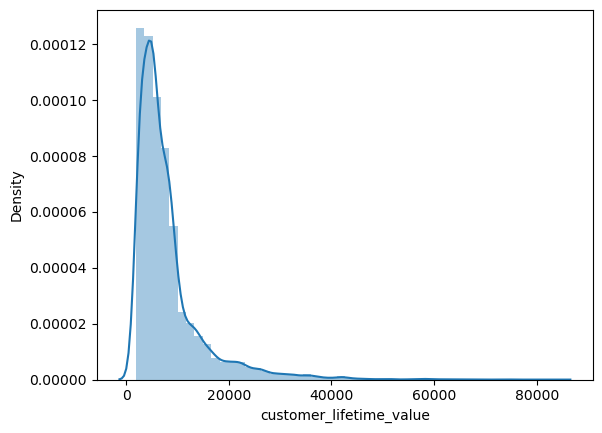

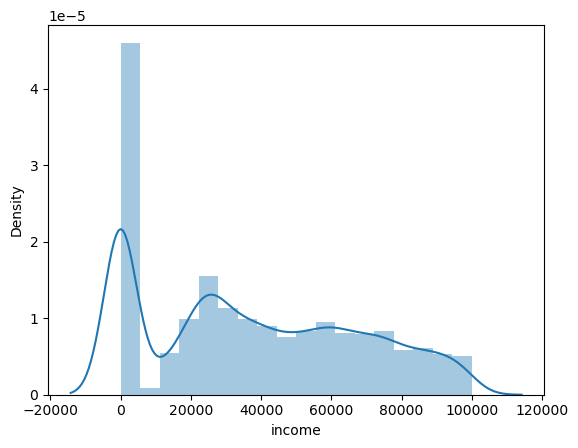

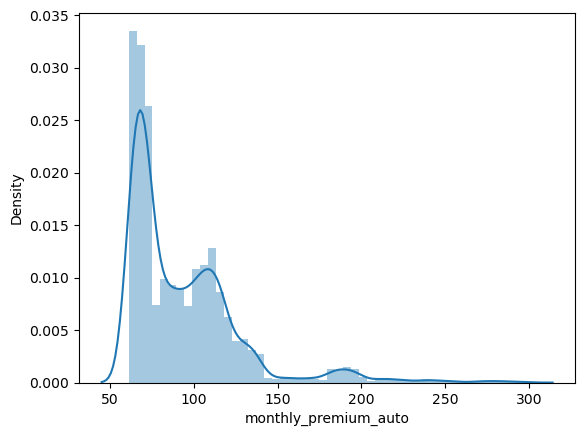

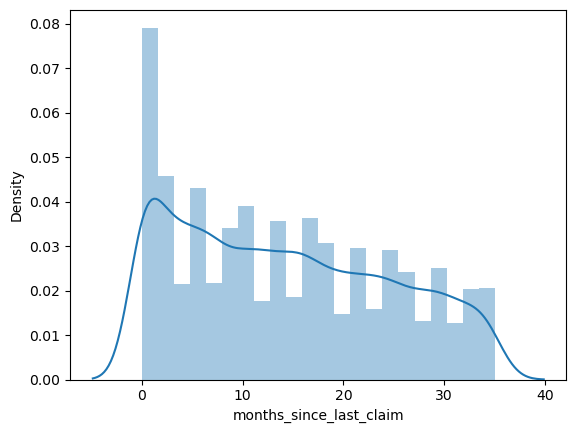

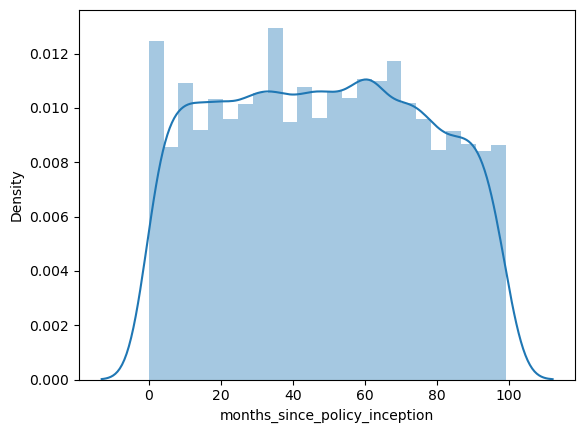

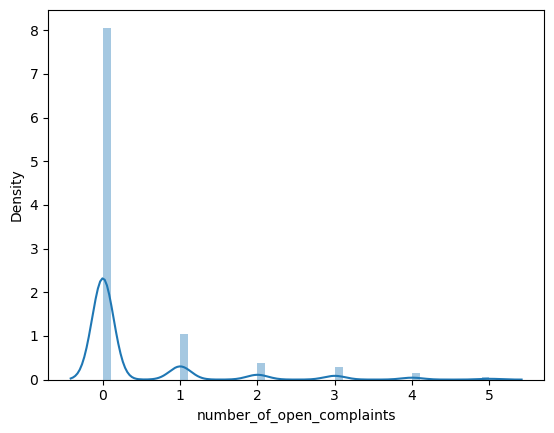

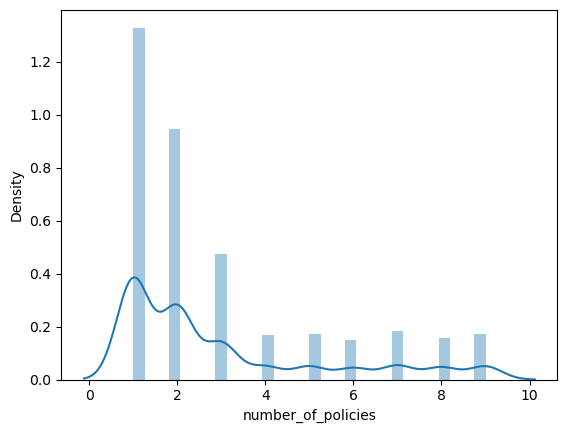

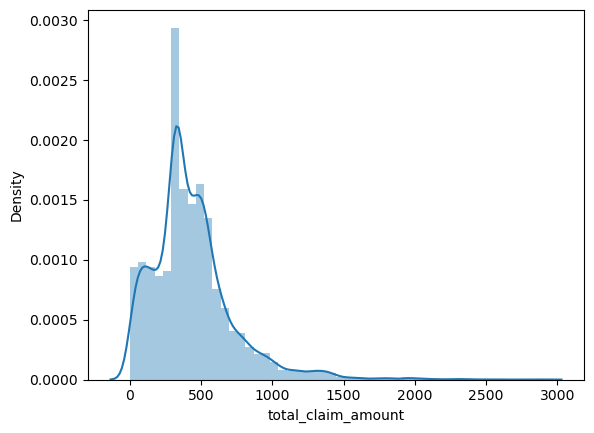

In [20]:
for column in numerical.columns:
    sns.distplot(numerical[column])
    plt.show()

In [21]:
data_corr = numerical.corr()
data_corr = round(data_corr,2)
data_corr

,customer_lifetime_value,income,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,total_claim_amount
customer_lifetime_value,1.00,0.03,0.40,0.02,0.02,-0.03,0.02,0.23
income,0.03,1.00,-0.01,-0.02,-0.01,0.01,-0.01,-0.35
monthly_premium_auto,0.40,-0.01,1.00,0.01,0.02,-0.01,-0.02,0.63
months_since_last_claim,0.02,-0.02,0.01,1.00,-0.04,0.04,-0.00,0.01
months_since_policy_inception,0.02,-0.01,0.02,-0.04,1.00,0.00,-0.01,0.00
number_of_open_complaints,-0.03,0.01,-0.01,0.04,0.00,1.00,0.00,-0.01
number_of_policies,0.02,-0.01,-0.02,-0.00,-0.01,0.00,1.00,-0.01
total_claim_amount,0.23,-0.35,0.63,0.01,0.00,-0.01,-0.01,1.00


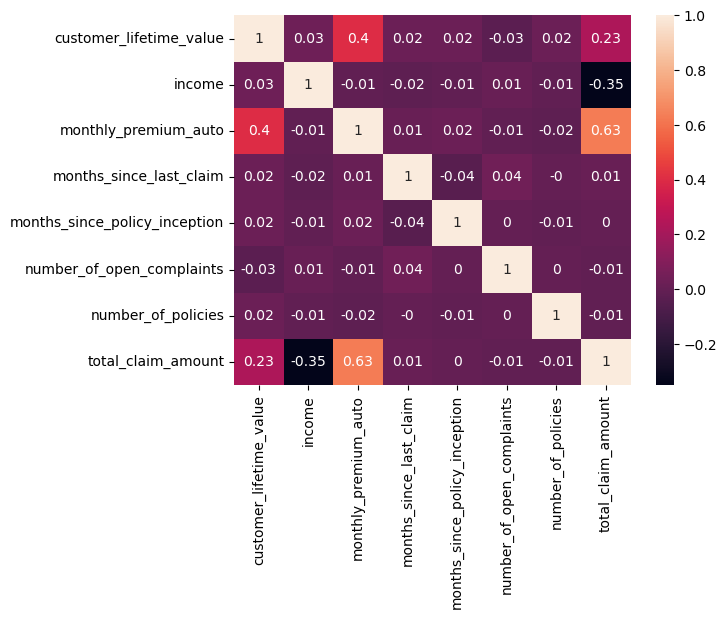

In [22]:
sns_plot = sns.heatmap(data_corr, annot=True)
figure = sns_plot.get_figure()    
figure.savefig('svm_conf.png', dpi=400)
plt.show()

### use the concept of multicollinearity and remove insignificant variables

There is no multicollinearity in the dataset but "Months Since Policy Inception" is an insgnificant varibale because its correlation with "Total Claim Amount" which is our target is 0.Also in general when sb did the policy inception should not have much effect on the claim amount.

 ### X-y split.

In [23]:
y = data['total_claim_amount']
X = data.drop(['total_claim_amount'], axis=1)
X.head()

,customer,state,customer_lifetime_value,response,coverage,education,effective_to_date,employmentstatus,gender,income,location_code,marital_status,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,policy_type,policy,renew_offer_type,sales_channel,vehicle_class,vehicle_size,vehicle_type
0,DK49336,Arizona,4809.216960,No,Basic,College,2/18/11,Employed,M,48029,Suburban,Married,61,7.0,52,0.0,9,Corporate Auto,Corporate L3,Offer3,Agent,Four-Door Car,Medsize,unkown
1,KX64629,California,2228.525238,No,Basic,College,1/18/11,Unemployed,F,0,Suburban,Single,64,3.0,26,0.0,1,Personal Auto,Personal L3,Offer4,Call Center,Four-Door Car,Medsize,unkown
2,LZ68649,Washington,14947.917300,No,Basic,Bachelor,2/10/11,Employed,M,22139,Suburban,Single,100,34.0,31,0.0,2,Personal Auto,Personal L3,Offer3,Call Center,SUV,Medsize,A
3,XL78013,Oregon,22332.439460,Yes,Extended,College,1/11/11,Employed,M,49078,Suburban,Single,97,10.0,3,0.0,2,Corporate Auto,Corporate L3,Offer2,Branch,Four-Door Car,Medsize,A
4,QA50777,Oregon,9025.067525,No,Premium,Bachelor,1/17/11,Medical Leave,F,23675,Suburban,Married,117,0.0,31,0.0,7,Personal Auto,Personal L2,Offer1,Branch,Four-Door Car,Medsize,unkown


In [24]:
X_num =X.select_dtypes(include = np.number)
X_cat = X.select_dtypes(include = np.object)
X_num.head()

,customer_lifetime_value,income,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies
0,4809.216960,48029,61,7.0,52,0.0,9
1,2228.525238,0,64,3.0,26,0.0,1
2,14947.917300,22139,100,34.0,31,0.0,2
3,22332.439460,49078,97,10.0,3,0.0,2
4,9025.067525,23675,117,0.0,31,0.0,7


### use a different method of scaling the numerical variables

#### MinMaxScaler approach

In [25]:
transformer= MinMaxScaler().fit(X_num)
X_minmax=transformer.transform(X_num)
X_minmax.shape

(10910, 7)

In [26]:
X_minmax

array([[0.03575222, 0.48038127, 0.        , ..., 0.52525253, 0.        ,
        1.        ],
       [0.00405905, 0.        , 0.01265823, ..., 0.26262626, 0.        ,
        0.        ],
       [0.16026441, 0.22143207, 0.16455696, ..., 0.31313131, 0.        ,
        0.125     ],
       ...,
       [0.27012165, 0.3984457 , 0.5907173 , ..., 0.63636364, 0.        ,
        0.125     ],
       [0.12371724, 0.64207199, 0.4092827 , ..., 0.27272727, 0.8       ,
        0.625     ],
       [0.06090719, 0.        , 0.16877637, ..., 0.01010101, 0.        ,
        0.25      ]])

In [27]:
X_num_norm=pd.DataFrame(X_minmax, columns=X_num.columns)
X_num_norm

,customer_lifetime_value,income,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies
0,0.035752,0.480381,0.000000,0.200000,0.525253,0.0,1.000
1,0.004059,0.000000,0.012658,0.085714,0.262626,0.0,0.000
2,0.160264,0.221432,0.164557,0.971429,0.313131,0.0,0.125
3,0.250953,0.490873,0.151899,0.285714,0.030303,0.0,0.125
4,0.087527,0.236795,0.236287,0.000000,0.313131,0.0,0.750
...,...,...,...,...,...,...,...
10905,0.167823,0.000000,0.810127,0.000000,0.404040,0.0,0.750
10906,0.041281,0.611576,0.016878,0.200000,0.686869,0.0,0.625
10907,0.270122,0.398446,0.590717,0.314286,0.636364,0.0,0.125
10908,0.123717,0.642072,0.409283,0.000000,0.272727,0.8,0.625


<AxesSubplot:xlabel='customer_lifetime_value', ylabel='Density'>

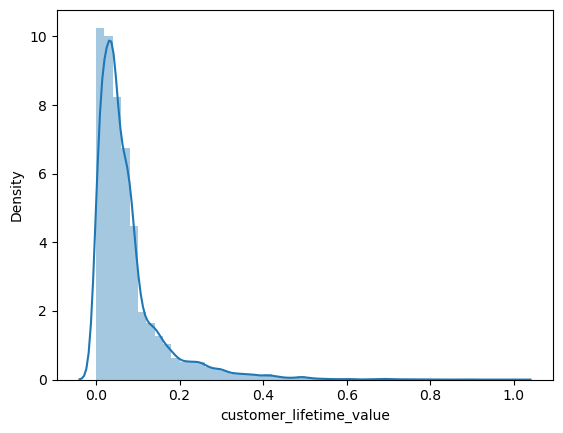

In [28]:
sns.distplot(X_num_norm['customer_lifetime_value'])

### StandardScaler

In [29]:
transformer = StandardScaler().fit(X_num)
X_standardized = transformer.transform(X_num)

In [30]:
X_num_stand = pd.DataFrame(X_standardized, columns=X_num.columns)
X_num_stand.head()

,customer_lifetime_value,income,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies
0,-0.466105,0.345635,-0.934819,-0.698755,0.139877,-0.406656,2.509455
1,-0.840946,-1.236462,-0.847713,-1.083209,-0.790709,-0.406656,-0.824922
2,1.006523,-0.507194,0.197554,1.896304,-0.611750,-0.406656,-0.408125
3,2.079112,0.380189,0.110448,-0.410415,-1.613919,-0.406656,-0.408125
4,0.146240,-0.456597,0.691152,-1.371549,-0.611750,-0.406656,1.675860


<AxesSubplot:xlabel='customer_lifetime_value', ylabel='Density'>

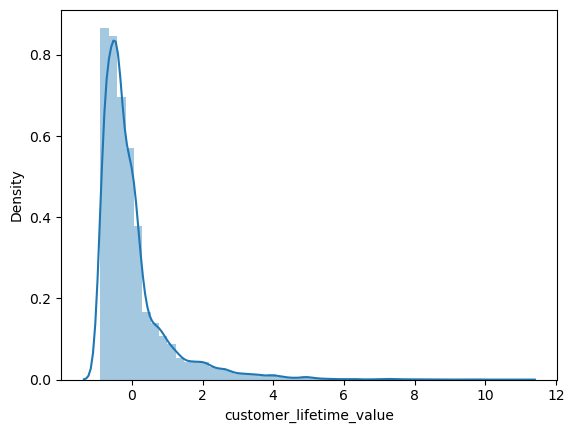

In [31]:
sns.distplot(X_num_stand['customer_lifetime_value'])

### Log transformation

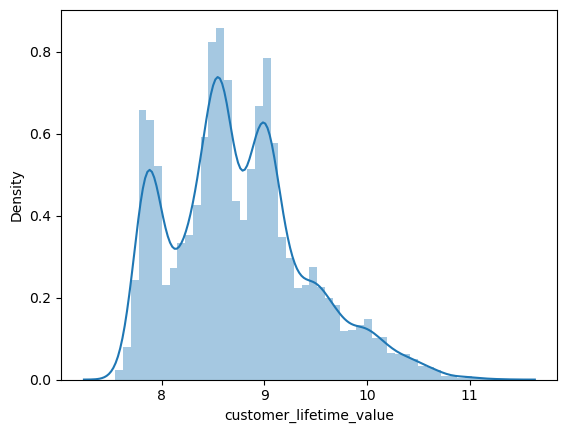

In [32]:
data1 = data.copy()

def log_transfom_clean(x):
    x = np.log(x)
    if np.isfinite(x):
        return x
    else:
        return np.NAN # or with np.NAN to change it to the mean afterwards with .fillna()

#data1['HV1'] = data1['HV1'].apply(log_transfom_clean)

data1['customer_lifetime_value'] = list(map(log_transfom_clean, data1['customer_lifetime_value']))

data1['customer_lifetime_value'] = data1['customer_lifetime_value'].fillna(np.mean(data1['customer_lifetime_value']))

sns.distplot(data1['customer_lifetime_value'])
plt.show()

### Box-Cox transformation

In [33]:
data2 = data.copy()
stats.boxcox(data2['customer_lifetime_value'])

(array([2.7284147 , 2.68197726, 2.77778619, ..., 2.79316278, 2.76958739,
        2.74599675]),
 -0.3472096131469141)

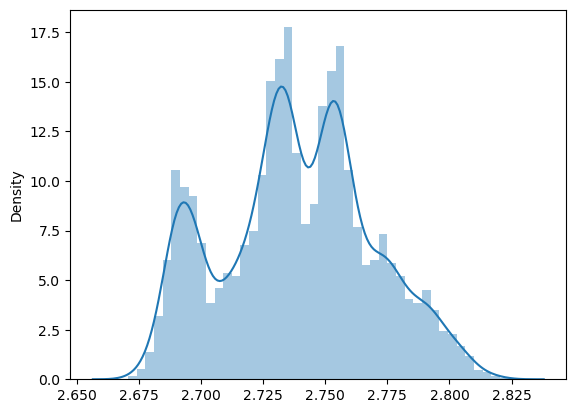

In [34]:
data2['customer_lifetime_value'] = np.where(data['customer_lifetime_value']<=0, np.NAN, data['customer_lifetime_value']) 

data2['customer_lifetime_value'] = data2['customer_lifetime_value'].fillna(data['customer_lifetime_value'].mean())

transformed_data, _ci = stats.boxcox(data2['customer_lifetime_value'])

sns.distplot(transformed_data)
plt.show()

### use a different ratio of train test split

#### Encoding with Get_dummies

In [35]:
X_cat= X_cat.replace(np.nan, 'Unknown')

In [36]:
for column in X_cat.columns:
    print(X_cat[column].unique())

['DK49336' 'KX64629' 'LZ68649' ... 'KX53892' 'TL39050' 'WA60547']
['Arizona' 'California' 'Washington' 'Oregon' 'unkown' 'Nevada']
['No' 'Yes' 'Unknown']
['Basic' 'Extended' 'Premium']
['College' 'Bachelor' 'High School or Below' 'Doctor' 'Master']
['2/18/11' '1/18/11' '2/10/11' '1/11/11' '1/17/11' '2/14/11' '2/24/11'
 '1/19/11' '1/4/11' '1/2/11' '2/7/11' '1/31/11' '1/26/11' '2/28/11'
 '1/16/11' '2/26/11' '2/23/11' '1/15/11' '2/2/11' '2/15/11' '1/24/11'
 '2/21/11' '2/22/11' '1/7/11' '1/28/11' '2/8/11' '2/12/11' '2/20/11'
 '1/5/11' '2/19/11' '1/3/11' '2/3/11' '1/22/11' '1/23/11' '2/5/11'
 '2/13/11' '1/25/11' '2/16/11' '2/1/11' '1/27/11' '1/12/11' '1/20/11'
 '2/6/11' '2/11/11' '1/21/11' '1/29/11' '1/9/11' '2/9/11' '2/27/11'
 '1/1/11' '2/17/11' '2/25/11' '1/13/11' '1/6/11' '2/4/11' '1/14/11'
 '1/10/11' '1/8/11' '1/30/11']
['Employed' 'Unemployed' 'Medical Leave' 'Disabled' 'Retired']
['M' 'F']
['Suburban' 'Urban' 'Rural']
['Married' 'Single' 'Divorced']
['Corporate Auto' 'Personal Auto' '

In [37]:
X_dumm = pd.get_dummies(X_cat, drop_first=True) # You can put X, not separating variables is needed.
X_dumm

,customer_AA11235,customer_AA16582,customer_AA30683,customer_AA34092,customer_AA35519,customer_AA56476,customer_AA69265,customer_AA71604,customer_AA93585,customer_AB13432,customer_AB21519,customer_AB23825,customer_AB26022,customer_AB31813,customer_AB45325,customer_AB60627,customer_AB62982,customer_AB69140,customer_AB72731,customer_AB73565,customer_AB78984,customer_AB96670,customer_AB98823,customer_AC13887,customer_AC22873,customer_AC24378,customer_AC40767,customer_AC42963,customer_AC58002,customer_AC67315,customer_AC73173,customer_AC75391,customer_AC79024,customer_AD12500,customer_AD18174,customer_AD28349,customer_AD28535,customer_AD33653,customer_AD33971,customer_AD38685,customer_AD56037,customer_AD63766,customer_AD71478,customer_AD89594,customer_AD95939,customer_AE23906,customer_AE30506,customer_AE60813,customer_AE62631,customer_AE74442,customer_AE89300,customer_AE90216,customer_AE93522,customer_AE98193,customer_AF10970,customer_AF17671,customer_AF20716,customer_AF36894,customer_AF37776,customer_AF41118,customer_AF47139,customer_AF48816,customer_AF49027,customer_AF49625,customer_AF69537,customer_AF81450,customer_AG22225,customer_AG32304,customer_AG39150,customer_AG45299,customer_AG47947,customer_AG56998,customer_AG58599,customer_AG62087,customer_AG62140,customer_AG85127,customer_AG85615,customer_AH17051,customer_AH22694,customer_AH39293,customer_AH41065,customer_AH41449,customer_AH53588,customer_AH55475,customer_AH58807,customer_AH65907,customer_AH84063,customer_AH89786,customer_AH92481,customer_AH97088,customer_AH99727,customer_AI11191,customer_AI14767,customer_AI16519,customer_AI47152,customer_AI49188,customer_AI49712,customer_AI58313,customer_AI58500,customer_AI61368,customer_AI74959,customer_AI85843,customer_AJ32539,customer_AJ58038,customer_AJ69060,customer_AJ69778,customer_AJ89107,customer_AJ89108,customer_AK11669,customer_AK11719,customer_AK17025,customer_AK44985,customer_AK46006,customer_AK54675,customer_AK59340,customer_AK61491,customer_AK72422,customer_AK90865,customer_AL21967,customer_AL27471,customer_AL35726,customer_AL43475,customer_AL43715,customer_AL46984,customer_AL50693,customer_AL78075,customer_AL95338,customer_AL96740,customer_AM17304,customer_AM26598,customer_AM26717,customer_AM28777,customer_AM29546,customer_AM30008,customer_AM32820,customer_AM34581,customer_AM36670,customer_AM52614,customer_AM53473,customer_AM57175,customer_AM72411,customer_AM79057,customer_AM88377,customer_AM89558,customer_AM92343,customer_AM94127,customer_AM97901,customer_AM99192,customer_AN21193,customer_AN32867,customer_AN36757,customer_AN47199,customer_AN53225,customer_AN57220,customer_AN67558,customer_AN79079,customer_AN80983,customer_AN97123,customer_AO20938,customer_AO40386,customer_AO42003,customer_AO46433,customer_AO74776,customer_AO77635,customer_AO87348,customer_AO98601,customer_AP23850,customer_AP27994,customer_AP32891,customer_AP34711,customer_AP46166,customer_AP47670,customer_AP52126,customer_AP52565,customer_AP56340,customer_AP59947,customer_AP63665,customer_AP65984,customer_AP66226,customer_AP67935,customer_AP89323,customer_AP90638,customer_AP95078,customer_AP98768,customer_AQ11656,customer_AQ25590,customer_AQ30231,customer_AQ34238,customer_AQ46199,customer_AQ51159,customer_AQ51368,customer_AQ52711,customer_AQ70385,customer_AQ70619,customer_AQ91207,customer_AQ94108,customer_AR17553,customer_AR25213,customer_AR40217,customer_AR47849,customer_AR59416,customer_AR61426,customer_AR63478,customer_AR69517,customer_AR75105,customer_AR83514,customer_AR96516,customer_AR99766,customer_AS17174,customer_AS18084,customer_AS26192,customer_AS48176,customer_AS55478,customer_AS55677,customer_AS60178,customer_AS62048,customer_AS77287,customer_AS78838,customer_AS93181,customer_AS97690,customer_AS99827,customer_AT13963,customer_AT18041,customer_AT24793,customer_AT26484,customer_AT29024,customer_AT30076,customer_AT31367,customer_AT33529,customer_AT36002,customer_AT41276,customer_AT49447,customer_AT52647,customer_AT55072,customer_AT62618,cust

### CONCAT X_dumm with X_num_norm => testing the model with MinMax Scaler transformation

In [38]:
X = pd.concat([X_num_norm, X_dumm], axis=1)
X.head()

,customer_lifetime_value,income,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,customer_AA11235,customer_AA16582,customer_AA30683,customer_AA34092,customer_AA35519,customer_AA56476,customer_AA69265,customer_AA71604,customer_AA93585,customer_AB13432,customer_AB21519,customer_AB23825,customer_AB26022,customer_AB31813,customer_AB45325,customer_AB60627,customer_AB62982,customer_AB69140,customer_AB72731,customer_AB73565,customer_AB78984,customer_AB96670,customer_AB98823,customer_AC13887,customer_AC22873,customer_AC24378,customer_AC40767,customer_AC42963,customer_AC58002,customer_AC67315,customer_AC73173,customer_AC75391,customer_AC79024,customer_AD12500,customer_AD18174,customer_AD28349,customer_AD28535,customer_AD33653,customer_AD33971,customer_AD38685,customer_AD56037,customer_AD63766,customer_AD71478,customer_AD89594,customer_AD95939,customer_AE23906,customer_AE30506,customer_AE60813,customer_AE62631,customer_AE74442,customer_AE89300,customer_AE90216,customer_AE93522,customer_AE98193,customer_AF10970,customer_AF17671,customer_AF20716,customer_AF36894,customer_AF37776,customer_AF41118,customer_AF47139,customer_AF48816,customer_AF49027,customer_AF49625,customer_AF69537,customer_AF81450,customer_AG22225,customer_AG32304,customer_AG39150,customer_AG45299,customer_AG47947,customer_AG56998,customer_AG58599,customer_AG62087,customer_AG62140,customer_AG85127,customer_AG85615,customer_AH17051,customer_AH22694,customer_AH39293,customer_AH41065,customer_AH41449,customer_AH53588,customer_AH55475,customer_AH58807,customer_AH65907,customer_AH84063,customer_AH89786,customer_AH92481,customer_AH97088,customer_AH99727,customer_AI11191,customer_AI14767,customer_AI16519,customer_AI47152,customer_AI49188,customer_AI49712,customer_AI58313,customer_AI58500,customer_AI61368,customer_AI74959,customer_AI85843,customer_AJ32539,customer_AJ58038,customer_AJ69060,customer_AJ69778,customer_AJ89107,customer_AJ89108,customer_AK11669,customer_AK11719,customer_AK17025,customer_AK44985,customer_AK46006,customer_AK54675,customer_AK59340,customer_AK61491,customer_AK72422,customer_AK90865,customer_AL21967,customer_AL27471,customer_AL35726,customer_AL43475,customer_AL43715,customer_AL46984,customer_AL50693,customer_AL78075,customer_AL95338,customer_AL96740,customer_AM17304,customer_AM26598,customer_AM26717,customer_AM28777,customer_AM29546,customer_AM30008,customer_AM32820,customer_AM34581,customer_AM36670,customer_AM52614,customer_AM53473,customer_AM57175,customer_AM72411,customer_AM79057,customer_AM88377,customer_AM89558,customer_AM92343,customer_AM94127,customer_AM97901,customer_AM99192,customer_AN21193,customer_AN32867,customer_AN36757,customer_AN47199,customer_AN53225,customer_AN57220,customer_AN67558,customer_AN79079,customer_AN80983,customer_AN97123,customer_AO20938,customer_AO40386,customer_AO42003,customer_AO46433,customer_AO74776,customer_AO77635,customer_AO87348,customer_AO98601,customer_AP23850,customer_AP27994,customer_AP32891,customer_AP34711,customer_AP46166,customer_AP47670,customer_AP52126,customer_AP52565,customer_AP56340,customer_AP59947,customer_AP63665,customer_AP65984,customer_AP66226,customer_AP67935,customer_AP89323,customer_AP90638,customer_AP95078,customer_AP98768,customer_AQ11656,customer_AQ25590,customer_AQ30231,customer_AQ34238,customer_AQ46199,customer_AQ51159,customer_AQ51368,customer_AQ52711,customer_AQ70385,customer_AQ70619,customer_AQ91207,customer_AQ94108,customer_AR17553,customer_AR25213,customer_AR40217,customer_AR47849,customer_AR59416,customer_AR61426,customer_AR63478,customer_AR69517,customer_AR75105,customer_AR83514,customer_AR96516,customer_AR99766,customer_AS17174,customer_AS18084,customer_AS26192,customer_AS48176,customer_AS55478,customer_AS55677,customer_AS60178,customer_AS62048,customer_AS77287,customer_AS78838,customer_AS93181,customer_AS97690,customer_AS99827,customer_AT13963,customer_AT18041,customer_AT24793,customer_AT26484,customer_AT29024,custom

In [39]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [40]:
len(X)*0.8

8728.0

In [41]:
len(X_train)

8728

In [42]:
len(X_test)

2182

In [43]:
model = LinearRegression()
model.fit(X_train,y_train)

LinearRegression()

In [44]:
predictions  = model.predict(X_test)
predictions

array([383.60126934, 350.4       , 608.07221188, ..., 525.6       ,
        44.97292017,  81.82816719])

In [45]:
y_test

4829     475.423848
5081     350.400000
5011     482.400000
4625     673.342650
3838     302.400000
            ...    
3819     432.000000
10089    484.800000
8740     525.600000
7831      47.451832
6075      29.884537
Name: total_claim_amount, Length: 2182, dtype: float64

In [46]:
r2_score(y_test, predictions), mean_squared_error(y_test, predictions, squared=False), mean_squared_error(y_test, predictions)

(0.7933236327661232, 129.18074443738107, 16687.66473339596)

In [47]:
r2 = r2_score(y_test, predictions)
RMSE = mean_squared_error(y_test, predictions, squared=False)
MSE = mean_squared_error(y_test, predictions)
print("r2 = ", r2)
print("RMSE = ", RMSE)
print("MSE = ", MSE)

r2 =  0.7933236327661232
RMSE =  129.18074443738107
MSE =  16687.66473339596


#### with 80% 20% train test split the model is improved. with 70%30% r2 was 0.7412944671096735

In [49]:
data['total_claim_amount'].describe()

count    10910.000000
mean       434.888330
std        292.180556
min          0.099007
25%        271.082527
50%        382.564630
75%        547.200000
max       2893.239678
Name: total_claim_amount, dtype: float64

### CONCAT X_dumm with X_num_stand to test the model with standard transformation

In [51]:
X = pd.concat([X_num_stand, X_dumm], axis=1)
X.head()

,customer_lifetime_value,income,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,customer_AA11235,customer_AA16582,customer_AA30683,customer_AA34092,customer_AA35519,customer_AA56476,customer_AA69265,customer_AA71604,customer_AA93585,customer_AB13432,customer_AB21519,customer_AB23825,customer_AB26022,customer_AB31813,customer_AB45325,customer_AB60627,customer_AB62982,customer_AB69140,customer_AB72731,customer_AB73565,customer_AB78984,customer_AB96670,customer_AB98823,customer_AC13887,customer_AC22873,customer_AC24378,customer_AC40767,customer_AC42963,customer_AC58002,customer_AC67315,customer_AC73173,customer_AC75391,customer_AC79024,customer_AD12500,customer_AD18174,customer_AD28349,customer_AD28535,customer_AD33653,customer_AD33971,customer_AD38685,customer_AD56037,customer_AD63766,customer_AD71478,customer_AD89594,customer_AD95939,customer_AE23906,customer_AE30506,customer_AE60813,customer_AE62631,customer_AE74442,customer_AE89300,customer_AE90216,customer_AE93522,customer_AE98193,customer_AF10970,customer_AF17671,customer_AF20716,customer_AF36894,customer_AF37776,customer_AF41118,customer_AF47139,customer_AF48816,customer_AF49027,customer_AF49625,customer_AF69537,customer_AF81450,customer_AG22225,customer_AG32304,customer_AG39150,customer_AG45299,customer_AG47947,customer_AG56998,customer_AG58599,customer_AG62087,customer_AG62140,customer_AG85127,customer_AG85615,customer_AH17051,customer_AH22694,customer_AH39293,customer_AH41065,customer_AH41449,customer_AH53588,customer_AH55475,customer_AH58807,customer_AH65907,customer_AH84063,customer_AH89786,customer_AH92481,customer_AH97088,customer_AH99727,customer_AI11191,customer_AI14767,customer_AI16519,customer_AI47152,customer_AI49188,customer_AI49712,customer_AI58313,customer_AI58500,customer_AI61368,customer_AI74959,customer_AI85843,customer_AJ32539,customer_AJ58038,customer_AJ69060,customer_AJ69778,customer_AJ89107,customer_AJ89108,customer_AK11669,customer_AK11719,customer_AK17025,customer_AK44985,customer_AK46006,customer_AK54675,customer_AK59340,customer_AK61491,customer_AK72422,customer_AK90865,customer_AL21967,customer_AL27471,customer_AL35726,customer_AL43475,customer_AL43715,customer_AL46984,customer_AL50693,customer_AL78075,customer_AL95338,customer_AL96740,customer_AM17304,customer_AM26598,customer_AM26717,customer_AM28777,customer_AM29546,customer_AM30008,customer_AM32820,customer_AM34581,customer_AM36670,customer_AM52614,customer_AM53473,customer_AM57175,customer_AM72411,customer_AM79057,customer_AM88377,customer_AM89558,customer_AM92343,customer_AM94127,customer_AM97901,customer_AM99192,customer_AN21193,customer_AN32867,customer_AN36757,customer_AN47199,customer_AN53225,customer_AN57220,customer_AN67558,customer_AN79079,customer_AN80983,customer_AN97123,customer_AO20938,customer_AO40386,customer_AO42003,customer_AO46433,customer_AO74776,customer_AO77635,customer_AO87348,customer_AO98601,customer_AP23850,customer_AP27994,customer_AP32891,customer_AP34711,customer_AP46166,customer_AP47670,customer_AP52126,customer_AP52565,customer_AP56340,customer_AP59947,customer_AP63665,customer_AP65984,customer_AP66226,customer_AP67935,customer_AP89323,customer_AP90638,customer_AP95078,customer_AP98768,customer_AQ11656,customer_AQ25590,customer_AQ30231,customer_AQ34238,customer_AQ46199,customer_AQ51159,customer_AQ51368,customer_AQ52711,customer_AQ70385,customer_AQ70619,customer_AQ91207,customer_AQ94108,customer_AR17553,customer_AR25213,customer_AR40217,customer_AR47849,customer_AR59416,customer_AR61426,customer_AR63478,customer_AR69517,customer_AR75105,customer_AR83514,customer_AR96516,customer_AR99766,customer_AS17174,customer_AS18084,customer_AS26192,customer_AS48176,customer_AS55478,customer_AS55677,customer_AS60178,customer_AS62048,customer_AS77287,customer_AS78838,customer_AS93181,customer_AS97690,customer_AS99827,customer_AT13963,customer_AT18041,customer_AT24793,customer_AT26484,customer_AT29024,custom

In [52]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [53]:
len(X)*0.8

8728.0

In [54]:
len(X_train)

8728

In [55]:
len(X_test)

2182

In [57]:
model = LinearRegression()
model.fit(X_train,y_train)

LinearRegression()

In [58]:
predictions  = model.predict(X_test)
predictions

array([380.45366409, 350.4       , 605.78238796, ..., 525.6       ,
        43.09237886,  77.47171777])

In [59]:
y_test

4829     475.423848
5081     350.400000
5011     482.400000
4625     673.342650
3838     302.400000
            ...    
3819     432.000000
10089    484.800000
8740     525.600000
7831      47.451832
6075      29.884537
Name: total_claim_amount, Length: 2182, dtype: float64

In [60]:
r2 = r2_score(y_test, predictions)
RMSE = mean_squared_error(y_test, predictions, squared=False)
MSE = mean_squared_error(y_test, predictions)
print("r2 = ", r2)
print("RMSE = ", RMSE)
print("MSE = ", MSE)

r2 =  0.795284713938793
RMSE =  128.56640776455123
MSE =  16529.321205480857


### very small improvement compared to when we scaled the data with minmax scaler